# 20 — Test DMS (Dense Material Segmentation, Apple ECCV 2022)

**Objectif :** valider la branche **matériaux principale** du pipeline CoolPath AVANT la fusion (notebook 21).

DMS = modèle généraliste 46 classes de matériaux (`dms46`), distribué en **TorchScript JIT** par Apple
(repo `apple/ml-dms-dataset`). Performances papier (DMS-Val, accuracy) : sky 0.94, foliage 0.90,
glass 0.70, concrete 0.59, metal 0.55 — suffisant comme signal matériau brut, le **semantic gating**
(notebook 21) éliminera les incohérences.

**Ce notebook :**
1. Télécharge `taxonomy.json` (noms + palette officielle)
2. Charge le modèle JIT (`torch.jit.load`)
3. Reproduit le préprocessing **exact** du `inference.py` officiel
4. Inférence sur ~10 images test (tes frames GoPro, fallback Vistas)
5. Visualisations étiquetées + distribution des matériaux détectés
6. Mapping préliminaire DMS46 → classes matériaux CoolPath

## ⚠️ Prérequis : checkpoint JIT

Le lien de téléchargement du modèle pré-entraîné est dans le **README** de
https://github.com/apple/ml-dms-dataset (section sur le modèle). Télécharge le `.pt` JIT
et place-le dans `checkpoints/` (n'importe quel nom contenant `dms`, ex: `checkpoints/dms46_jit.pt`).

## 1. Environnement

In [1]:
import os, json, math, random, time
from pathlib import Path
import numpy as np
import cv2
import requests
import torch
import torchvision.transforms as TTR
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from skimage.measure import label as cc_label, regionprops

PROJECT_ROOT    = Path("..").resolve()
CHECKPOINTS_DIR = PROJECT_ROOT / "checkpoints"
OUTPUT_DIR      = PROJECT_ROOT / "data" / "outputs" / "dms_test"
MASKS_DIR       = OUTPUT_DIR / "masks_indices"
VIZ_DIR         = OUTPUT_DIR / "viz"
for d in (OUTPUT_DIR, MASKS_DIR, VIZ_DIR):
    d.mkdir(parents=True, exist_ok=True)

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device : {device}")
if torch.cuda.is_available():
    print(f"GPU    : {torch.cuda.get_device_name(0)}")


Device : cuda
GPU    : NVIDIA GeForce RTX 2060


## 2. Taxonomie DMS officielle

- `dms46` : les 46 indices de la taxonomie complète réellement prédits par le modèle (liste officielle de `inference.py`)
- `taxonomy.json` : téléchargé directement depuis le repo (pas besoin de git clone)
- la sortie du modèle utilise des indices **compacts 0..45** dans l'ordre de `dms46` → la palette et les noms sont filtrés dans le même ordre

In [2]:
# Liste officielle (inference.py, apple/ml-dms-dataset)
dms46 = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 23,
         24, 26, 27, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 41, 43, 44, 46, 47, 48, 49,
         50, 51, 52, 53, 56]

TAXONOMY_PATH = OUTPUT_DIR / "taxonomy.json"
if not TAXONOMY_PATH.exists():
    url = "https://raw.githubusercontent.com/apple/ml-dms-dataset/main/taxonomy.json"
    print(f"Telechargement taxonomy.json ...")
    r = requests.get(url, timeout=60)
    r.raise_for_status()
    TAXONOMY_PATH.write_bytes(r.content)
    print("OK")

t = json.load(open(TAXONOMY_PATH, "rb"))
print(f"Cles taxonomy.json : {list(t.keys())}")

# Palette filtree sur dms46 (pattern officiel)
srgb_colormap = [t["srgb_colormap"][i] for i in range(len(t["srgb_colormap"])) if i in dms46]
srgb_colormap = np.array(srgb_colormap, dtype=np.uint8)
print(f"Palette : {srgb_colormap.shape}")

# Noms de classes : extraction robuste (la cle exacte peut varier)
names_full = None
for key in ("names", "shortnames", "dms_names", "labels", "class_names"):
    if key in t and isinstance(t[key], list) and len(t[key]) == len(t["srgb_colormap"]):
        names_full = t[key]
        print(f"Noms trouves sous la cle '{key}'")
        break
if names_full is None:
    # fallback : chercher n'importe quelle liste de strings de meme longueur
    for key, val in t.items():
        if isinstance(val, list) and len(val) == len(t["srgb_colormap"]) \
           and all(isinstance(x, str) for x in val):
            names_full = val
            print(f"Noms trouves sous la cle '{key}' (fallback)")
            break
assert names_full is not None, "Noms de classes introuvables dans taxonomy.json — affiche t.keys() et adapte"

DMS_NAMES = [names_full[i] for i in range(len(names_full)) if i in dms46]
print(f"\n{len(DMS_NAMES)} classes DMS46 :")
for i, n in enumerate(DMS_NAMES):
    print(f"  {i:2d}  {n}")


Cles taxonomy.json : ['colormap', 'names', 'semantic_labels', 'shortnames', 'srgb_colormap']
Palette : (46, 3)
Noms trouves sous la cle 'names'

46 classes DMS46 :
   0  Animal skin
   1  Bone/teeth/horn
   2  Brickwork
   3  Cardboard
   4  Carpet/rug
   5  Ceiling tile
   6  Ceramic
   7  Chalkboard/blackboard
   8  Clutter
   9  Concrete
  10  Cork/corkboard
  11  Engineered stone
  12  Fabric/cloth
  13  Fire
  14  Foliage
  15  Food
  16  Fur
  17  Gemstone/quartz
  18  Glass
  19  Hair
  20  Ice
  21  Leather
  22  Metal
  23  Mirror
  24  Paint/plaster/enamel
  25  Paper
  26  Photograph/painting
  27  Plastic, clear
  28  Plastic, non-clear
  29  Rubber/latex
  30  Sand
  31  Skin/lips
  32  Sky
  33  Snow
  34  Soil/mud
  35  Stone, natural
  36  Stone, polished
  37  Tile
  38  Wallpaper
  39  Water
  40  Wax
  41  Whiteboard
  42  Wicker
  43  Wood
  44  Wood, tree
  45  Asphalt


## 3. Chargement du modèle JIT

In [3]:
# Auto-detection du checkpoint JIT dans checkpoints/
candidates = [p for p in CHECKPOINTS_DIR.glob("*.pt") if "dms" in p.name.lower()]
candidates += [p for p in CHECKPOINTS_DIR.glob("*.pth") if "dms" in p.name.lower()]
assert candidates, (
    f"Checkpoint DMS introuvable dans {CHECKPOINTS_DIR}.\n"
    "Telecharge le modele JIT depuis le README de github.com/apple/ml-dms-dataset "
    "et place-le dans checkpoints/ (nom contenant 'dms')."
)
JIT_PATH = candidates[0]
print(f"Checkpoint : {JIT_PATH.name}")

model = torch.jit.load(str(JIT_PATH))
if device == "cuda":
    model = model.cuda()
model.eval()
print("Modele DMS charge (TorchScript JIT).")


Checkpoint : DMS46_v1.pt
Modele DMS charge (TorchScript JIT).


## 4. Préprocessing + inférence — pipeline EXACT du `inference.py` officiel

Fidèle au code Apple :
- `cv2.imread` BGR → RGB
- resize **côté min vers 512** : `scale = min(512/h, 512/w)`, `PIL.LANCZOS`
- `Normalize(mean·255, std·255)` ImageNet
- sortie : `model(image)[0].data.cpu()[0, 0]` → carte de labels compacts 0..45
- le masque est ensuite remis à la taille originale en `INTER_NEAREST` (jamais de bilinéaire sur des labels)

In [4]:
value_scale = 255
MEAN = [0.485 * value_scale, 0.456 * value_scale, 0.406 * value_scale]
STD  = [0.229 * value_scale, 0.224 * value_scale, 0.225 * value_scale]
NEW_DIM = 512   # valeur officielle du inference.py


def predict_dms(img_bgr, new_dim=NEW_DIM):
    """img_bgr (H,W,3) -> mask indices compacts 0..45 a la taille originale."""
    H0, W0 = img_bgr.shape[:2]
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    scale = min(float(new_dim) / H0, float(new_dim) / W0)
    new_h, new_w = math.ceil(scale * H0), math.ceil(scale * W0)
    img = np.array(Image.fromarray(img).resize((new_w, new_h), Image.LANCZOS))

    image = torch.from_numpy(img.transpose((2, 0, 1))).float()
    image = TTR.Normalize(MEAN, STD)(image)
    if device == "cuda":
        image = image.cuda()
    image = image.unsqueeze(0)

    with torch.no_grad():
        prediction = model(image)[0].data.cpu()[0, 0].numpy()

    mask = prediction.astype(np.uint8)
    mask = cv2.resize(mask, (W0, H0), interpolation=cv2.INTER_NEAREST)
    return mask


def colorize_dms(mask):
    return np.take(srgb_colormap, mask, axis=0)   # RGB pour matplotlib


## 5. Images de test (frames GoPro, fallback Vistas)

In [7]:
N_TEST = 10
random.seed(42)

SOURCES = [
    PROJECT_ROOT / "data" / "mapillary_vistas" / "validation" / "images",
    PROJECT_ROOT / "data" / "pano360_test" / "images",
]
TEST_DIR = next((d for d in SOURCES if d.exists() and any(d.glob("*.jpg")) or d.exists() and any(d.glob("*.png"))), None)
assert TEST_DIR is not None, f"Aucun dossier d'images trouve parmi : {[str(s) for s in SOURCES]}"

paths = sorted(list(TEST_DIR.glob("*.jpg")) + list(TEST_DIR.glob("*.png")))
test_paths = random.sample(paths, k=min(N_TEST, len(paths)))
print(f"Source : {TEST_DIR}")
print(f"{len(test_paths)} images test")


Source : C:\Users\youss\Downloads\coolpath_local\data\mapillary_vistas\validation\images
10 images test


## 6. Inférence + visualisation étiquetée

[1/10] oJAdhUthZ3TD6plOYFciKg.jpg  (545 ms)


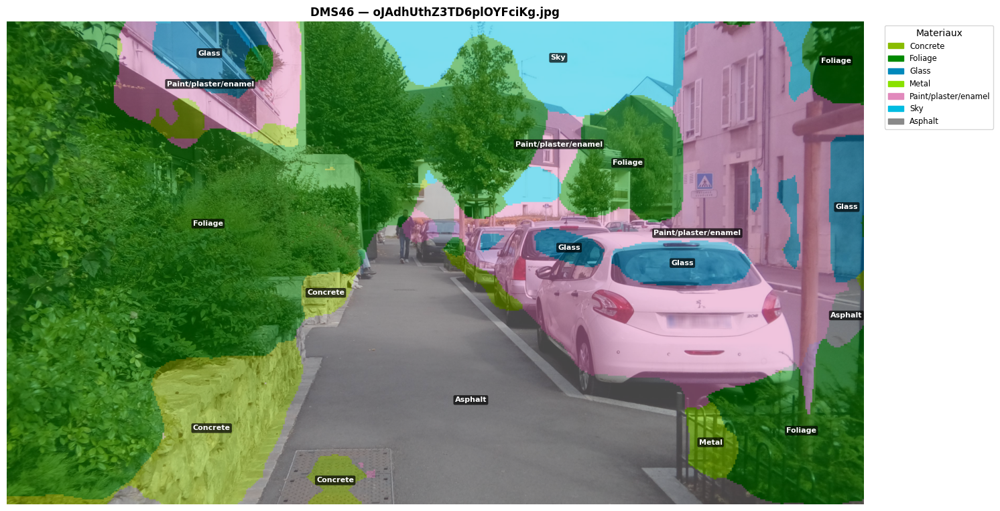

[2/10] 5xXH_FtKsUhNSeOgfjUUqg.jpg  (365 ms)


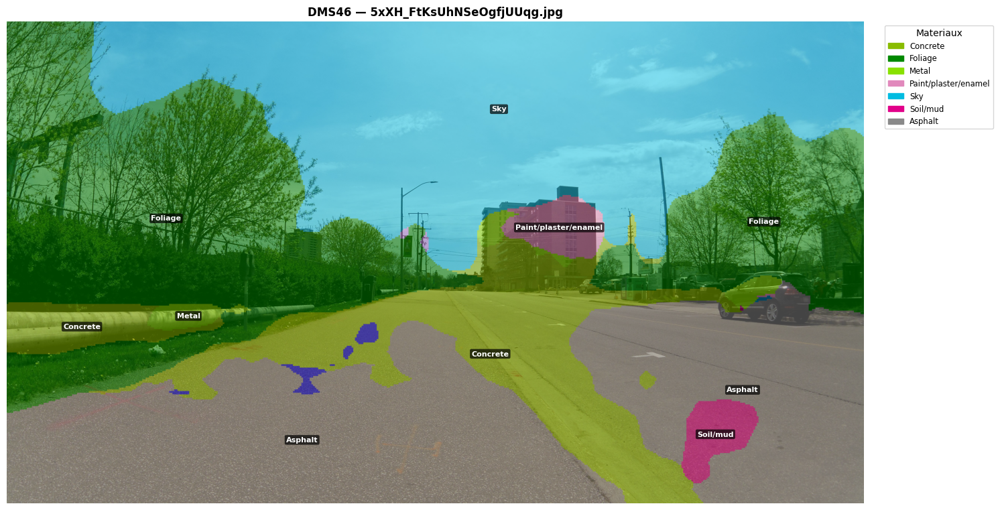

[3/10] 0wcA84wys1Ag1X-_L8PreA.jpg  (786 ms)


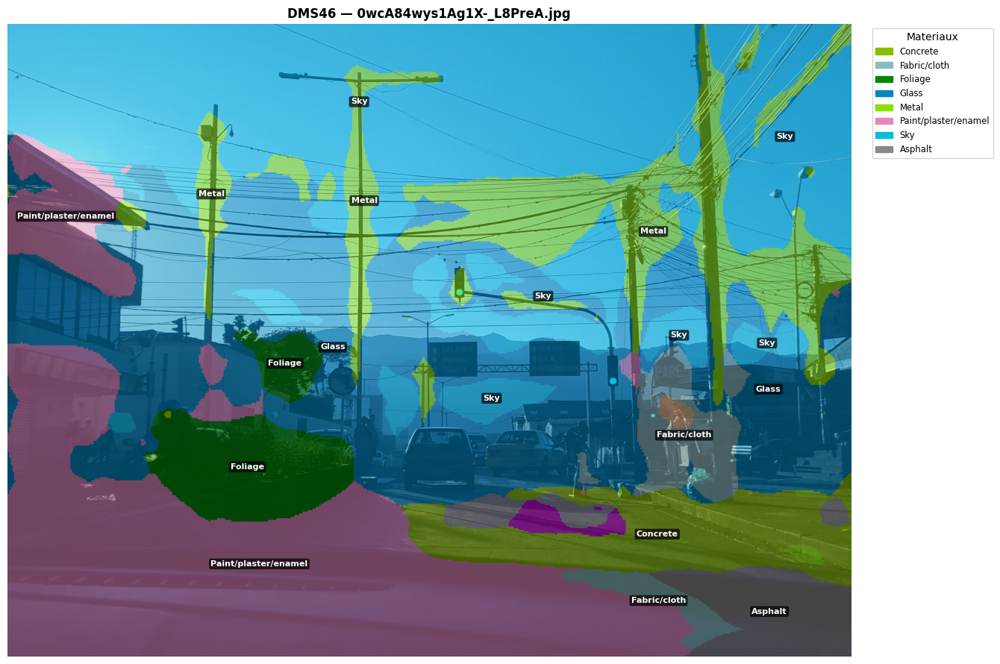

[4/10] RQh5exRs_Kxnu-I5Vnaxaw.jpg  (615 ms)


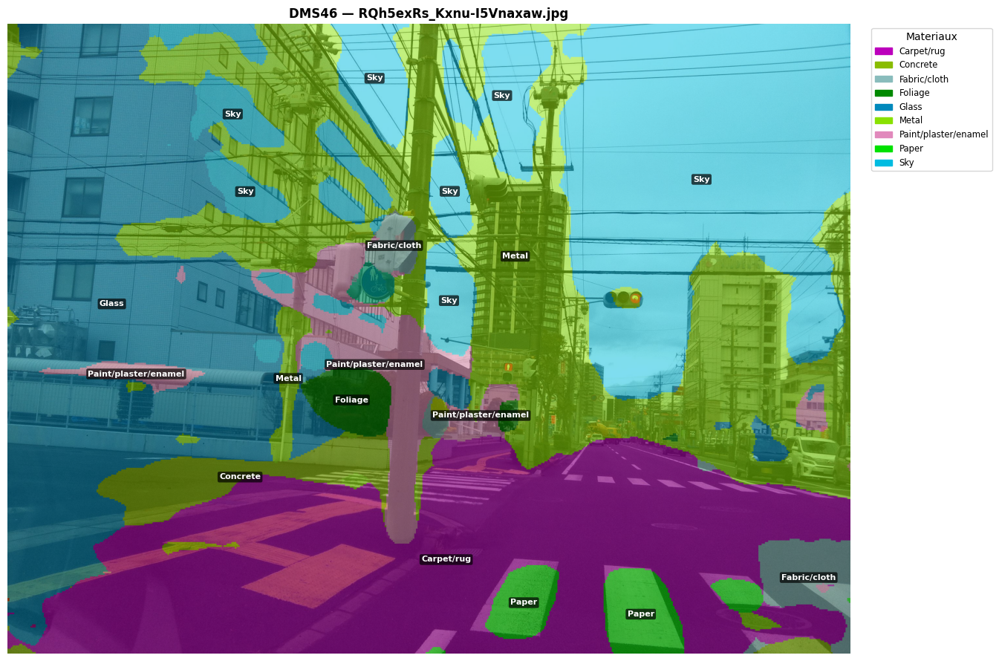

[5/10] cDvtKnuYMm7IXAUpybkkaQ.jpg  (566 ms)


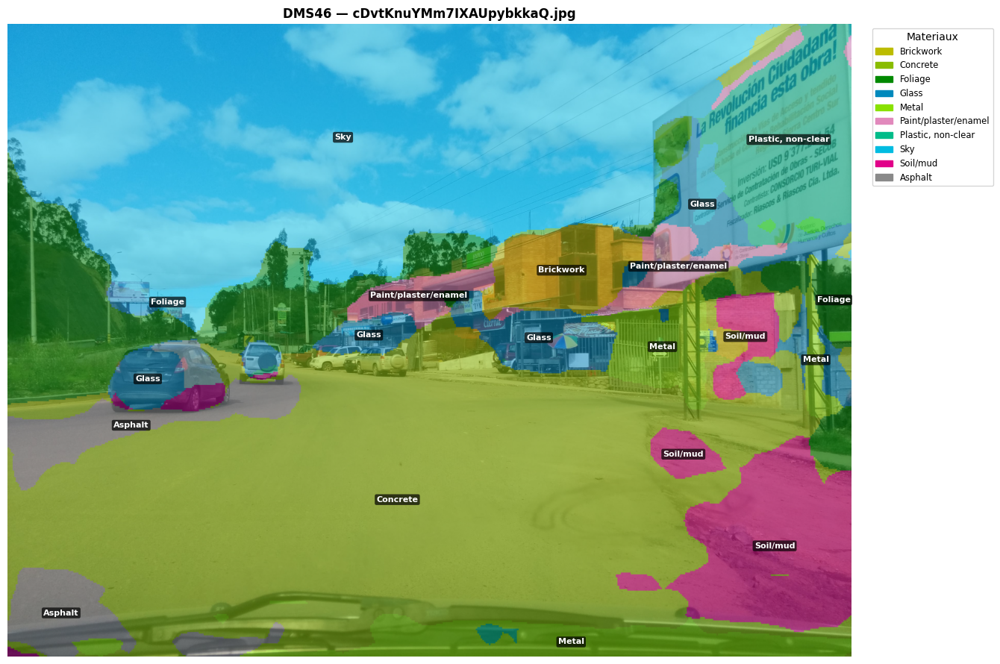

[6/10] BfKp88YxoeTWyNGyD1KPVw.jpg  (649 ms)


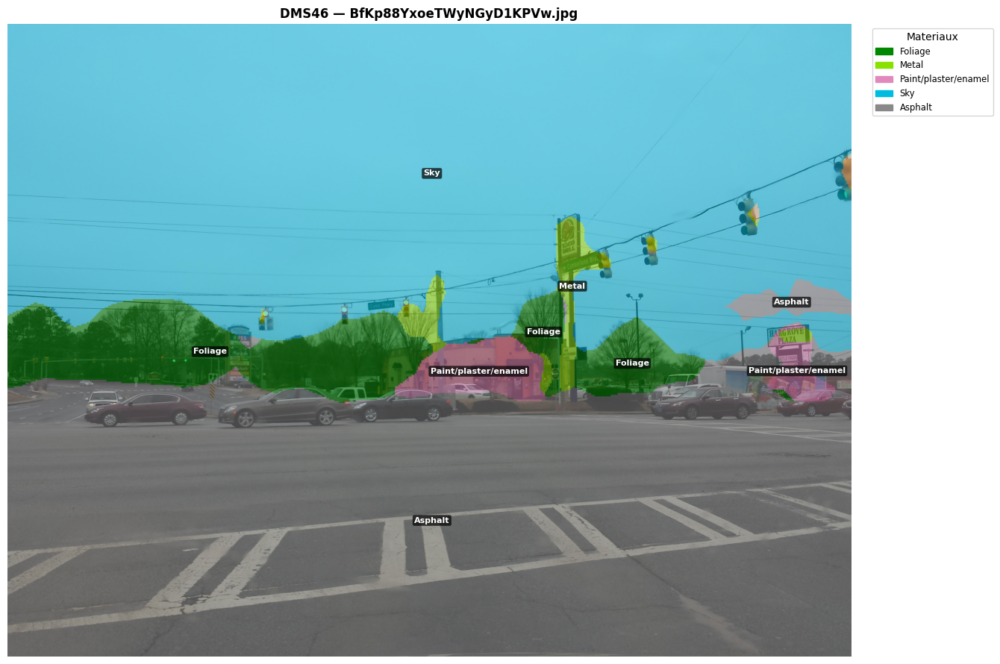

[7/10] ASbiu8iObBT2iXL1LPzjkQ.jpg  (329 ms)


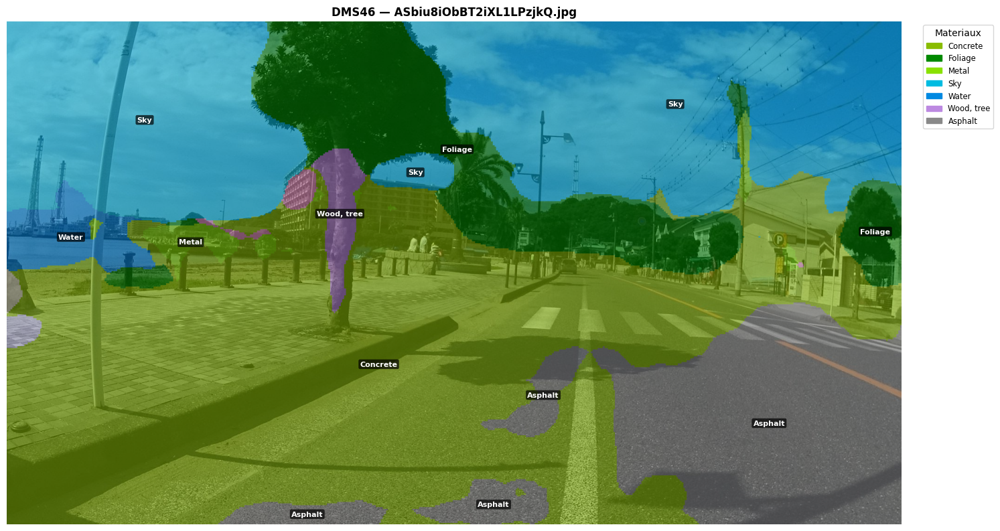

[8/10] 7GX8DVGcbajiJfn7xJbpUw.jpg  (464 ms)


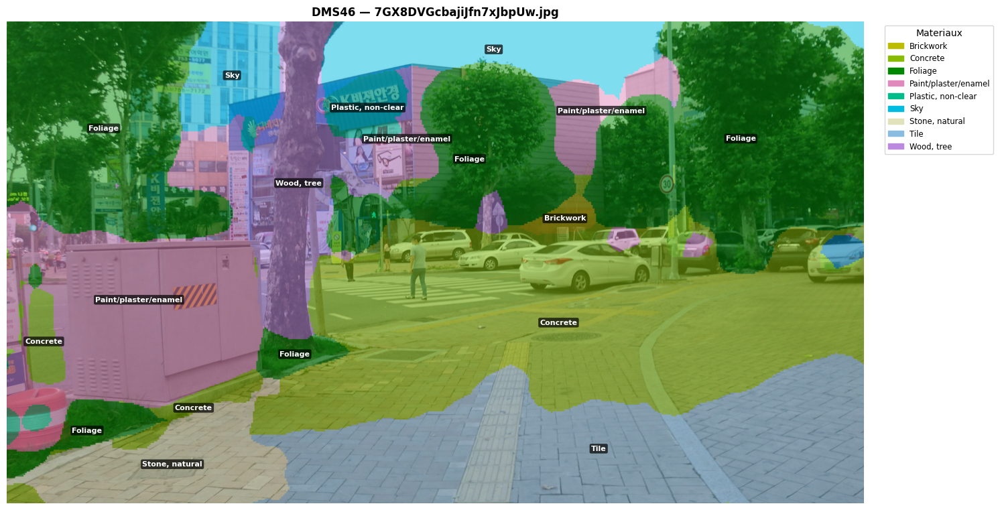

[9/10] rMqdTNhQ3gk2fFheVYQaug.jpg  (355 ms)


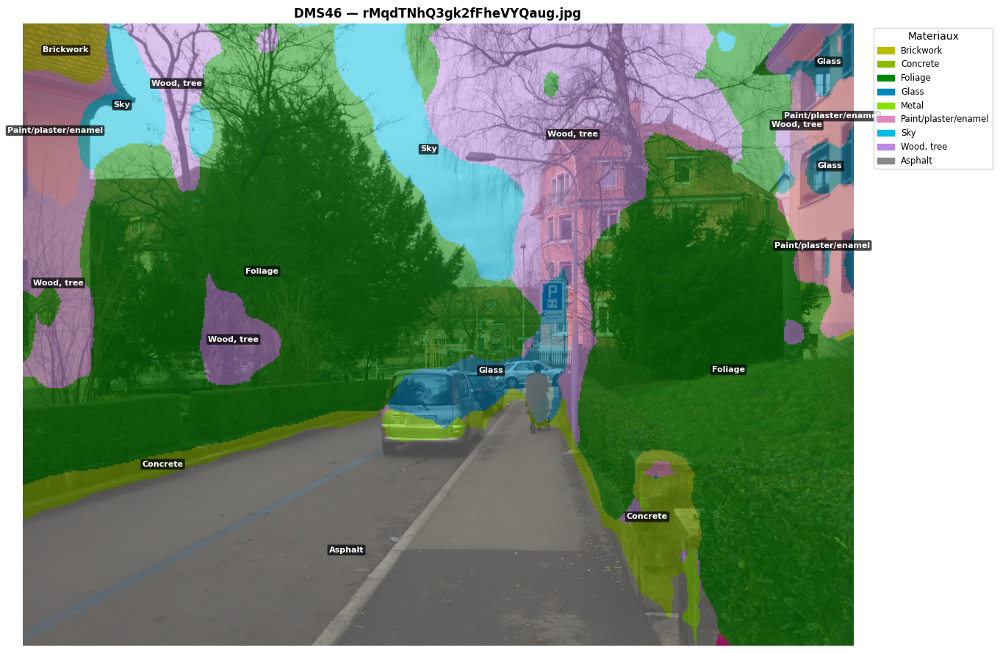

[10/10] 5gEY38kEOGdXzal_RKJpaA.jpg  (366 ms)


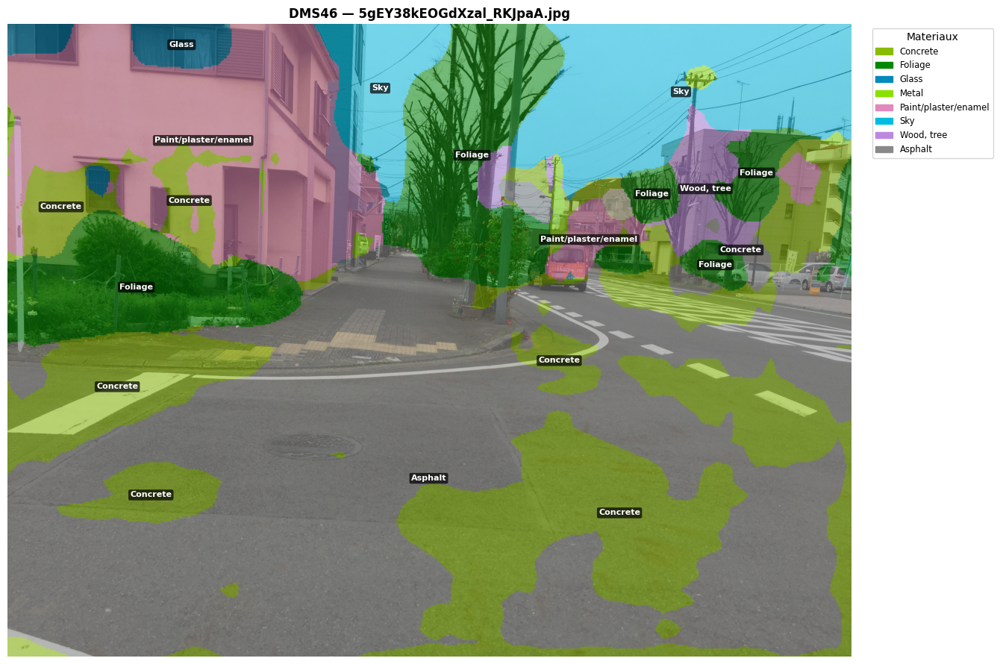


Temps moyen : 504 ms/image
Masques : C:\Users\youss\Downloads\coolpath_local\data\outputs\dms_test\masks_indices
Visualisations : C:\Users\youss\Downloads\coolpath_local\data\outputs\dms_test\viz


In [8]:
def viz_dms(img_rgb, mask, title, save_path, alpha=0.5, min_area_frac=0.004):
    overlay = ((1 - alpha) * img_rgb + alpha * colorize_dms(mask)).astype(np.uint8)
    fig, ax = plt.subplots(figsize=(15, 9))
    ax.imshow(overlay)
    h, w = mask.shape
    min_area = int(min_area_frac * h * w)
    present = []
    for cid in np.unique(mask):
        if cid >= len(DMS_NAMES):
            continue
        region = (mask == cid)
        if region.sum() >= min_area:
            present.append(cid)
        lbl = cc_label(region.astype(np.uint8))
        for reg in regionprops(lbl):
            if reg.area >= min_area:
                cy, cx = reg.centroid
                ax.text(cx, cy, DMS_NAMES[cid], ha="center", va="center",
                        fontsize=8, color="white", fontweight="bold",
                        bbox=dict(boxstyle="round,pad=0.2", facecolor="black",
                                  alpha=0.7, edgecolor="none"))
    handles = [Patch(color=srgb_colormap[c] / 255.0, label=DMS_NAMES[c]) for c in present]
    ax.legend(handles=handles, bbox_to_anchor=(1.02, 1), loc="upper left",
              fontsize="small", title="Materiaux")
    ax.set_title(title, fontweight="bold"); ax.axis("off")
    plt.tight_layout()
    plt.savefig(save_path, dpi=100, bbox_inches="tight")
    plt.show()


pixel_counts = np.zeros(len(DMS_NAMES), dtype=np.int64)
times = []

for i, p in enumerate(test_paths, 1):
    img_bgr = cv2.imread(str(p))
    if img_bgr is None:
        print(f"[{i}] {p.name} illisible, skip"); continue

    t0 = time.perf_counter()
    mask = predict_dms(img_bgr)
    times.append(time.perf_counter() - t0)

    cv2.imwrite(str(MASKS_DIR / f"{p.stem}_dms.png"), mask)
    pixel_counts += np.bincount(mask.ravel(), minlength=len(DMS_NAMES))[:len(DMS_NAMES)]

    print(f"[{i}/{len(test_paths)}] {p.name}  ({times[-1]*1000:.0f} ms)")
    viz_dms(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB), mask,
            f"DMS46 — {p.name}", VIZ_DIR / f"{p.stem}_dms.png")
    if i % 5 == 0:
        torch.cuda.empty_cache()

print(f"\nTemps moyen : {np.mean(times)*1000:.0f} ms/image")
print(f"Masques : {MASKS_DIR}")
print(f"Visualisations : {VIZ_DIR}")


## 7. Distribution des matériaux détectés

In [ ]:
import pandas as pd

total = pixel_counts.sum()
df = pd.DataFrame({
    "materiau": DMS_NAMES,
    "pixels": pixel_counts,
    "proportion_%": (pixel_counts / max(total, 1) * 100).round(2),
}).sort_values("pixels", ascending=False).reset_index(drop=True)

present = df[df["pixels"] > 0]
print(present.to_string(index=False))
df.to_csv(OUTPUT_DIR / "dms_class_distribution.csv", index=False)

top = present.head(15)
fig, ax = plt.subplots(figsize=(12, 5))
colors = [srgb_colormap[DMS_NAMES.index(n)] / 255.0 for n in top["materiau"]]
ax.bar(top["materiau"], top["proportion_%"], color=colors, edgecolor="black")
ax.set_ylabel("Proportion de pixels (%)")
ax.set_title(f"Top materiaux DMS46 sur {len(test_paths)} images", fontweight="bold")
plt.xticks(rotation=35, ha="right")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "dms_distribution.png", dpi=110, bbox_inches="tight")
plt.show()


## 8. Mapping préliminaire DMS46 → classes matériaux CoolPath

Mapping **par nom** (insensible à la casse, matching partiel) → robuste même si l'ordre des indices
diffère. Les classes non urbaines (fur, food, skin, hair...) → `other`. Ce dict sera
l'entrée du **semantic gating** du notebook 21.

In [ ]:
# regle de matching : si un des motifs est contenu dans le nom DMS (lowercase) -> classe CoolPath
COOLPATH_MAPPING_RULES = {
    "asphalt":    ["asphalt"],
    "concrete":   ["concrete", "cement"],
    "brick":      ["brick"],
    "stone":      ["stone"],                      # natural / polished / engineered
    "ceramic":    ["ceramic", "tile"],
    "glass":      ["glass", "mirror"],
    "metal":      ["metal"],
    "wood":       ["wood"],                       # wood + tree wood
    "plastic":    ["plastic", "rubber"],
    "paint":      ["paint", "plaster", "whiteboard", "wallpaper"],
    "vegetation": ["foliage"],
    "soil":       ["soil", "mud"],
    "sand":       ["sand"],
    "sky":        ["sky"],
    "water":      ["water", "snow", "ice"],
}

dms_to_coolpath = {}
for idx, name in enumerate(DMS_NAMES):
    nl = name.lower()
    assigned = "other"
    for cp_cls, patterns in COOLPATH_MAPPING_RULES.items():
        if any(pat in nl for pat in patterns):
            assigned = cp_cls
            break
    dms_to_coolpath[idx] = assigned

print(f"{'idx':>4} {'DMS46':<35} -> CoolPath")
for idx, name in enumerate(DMS_NAMES):
    print(f"{idx:>4} {name:<35} -> {dms_to_coolpath[idx]}")

# Verification : tous les materiaux urbains cles sont couverts ?
covered = set(dms_to_coolpath.values())
expected = set(COOLPATH_MAPPING_RULES.keys())
missing = expected - covered
print(f"\nClasses CoolPath couvertes : {sorted(covered - {'other'})}")
if missing:
    print(f"⚠ Non couvertes par DMS46 (a chercher cote BFMS) : {sorted(missing)}")

import json as _json
(OUTPUT_DIR / "dms_to_coolpath.json").write_text(
    _json.dumps({"dms_names": DMS_NAMES, "mapping": dms_to_coolpath}, indent=2))
print(f"\nMapping sauvegarde : {OUTPUT_DIR / 'dms_to_coolpath.json'}")


## 9. Critères de validation avant le notebook 21

**À vérifier visuellement sur les overlays :**
- `sky` et `foliage` quasi parfaits (acc papier 0.94 / 0.90) — sinon problème de préprocessing
- `asphalt` sur la chaussée, `concrete` sur trottoirs/bâtiments — confusions asphalt/concrete attendues (acc 0.59), le **semantic gating** (route→asphalt prioritaire, trottoir→concrete) corrigera
- `glass` sur les fenêtres, `metal` sur véhicules/poteaux
- masque grossier normal : inférence à 512 px côté min (officiel) — option `new_dim=768` à tester si trop grossier

**Limites connues (rapport) :** modèle entraîné majoritairement indoor+outdoor générique, pas street-level pur ;
résolution d'inférence faible ; classes urbaines fines (gravel, cobblestone) absentes de DMS46 → complétées par BFMS.

**Prochaine étape :** notebook 21 — fusion 3 branches (Mask2Former sémantique + DMS/BFMS matériaux + semantic gating)
avec ton script BFMS corrigé, puis table albédo/émissivité.